First I need to simulate 1d Run and Tumble

In [3]:
using Distributions
using Random
using Statistics
using StatsBase
using Plots
using LaTeXStrings

In [49]:
l0 = 1.0 ## Mean step size
step_dist = Exponential(l0) ## Distributions

function single_step(step_dist)  ### Generating single step
    dir = rand(Bool) ? 1.0 : -1.0
    l = rand(step_dist)
    return dir * l
end

function single_run(N, step_dist) ### Generating single run for N number of steps
    x = 0.0
    for i in 1:N
        x += single_step(step_dist)
    end
    return x
end

function generate_ensemble(M, N, step_dist) ## Function generating complete data for given M and N
    x_all = Vector{Float64}(undef, M)
    for j in 1:M
        x_all[j] = single_run(N, step_dist)
    end
    return x_all
end

function bootstrap_error(x, stat_func; n_boot=200)
    M = length(x)
    boot_vals = Vector{Float64}(undef, n_boot)
    for b in 1:n_boot
        resample = x[rand(1:M, M)]      ## resample M points WITH replacement from x
        boot_vals[b] = stat_func(resample)
    end
    return std(boot_vals)               ## spread across resamples = estimated std error
end

bootstrap_error (generic function with 1 method)

In [5]:
M = 10^5
Ns = [10, 100, 10^3, 10^4]

walkers = Dict{Int, Vector{Float64}}()
for N in Ns
    walkers[N] = generate_ensemble(M, N, step_dist)
    println("done N=$N")
end

done N=10
done N=100
done N=1000
done N=10000


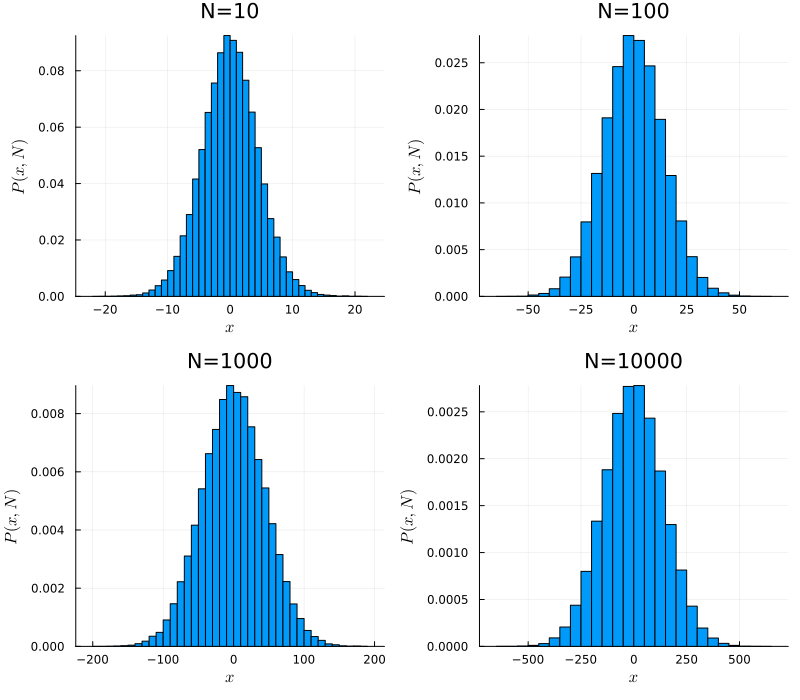

In [6]:
## --- 2x2 grid: raw histogram of x_N for each N separately (plain histogram, not steppost) ---
hist_plots = []
for N in Ns
    x = walkers[N]
    p = histogram(x, bins=50, normalize=:pdf,
                  label="N=$N", xlabel=L"x", ylabel=L"P(x,N)", title="N=$N",
                  legend=false)
    push!(hist_plots, p)
end

plot(hist_plots..., layout=(2,2), size=(800,700))

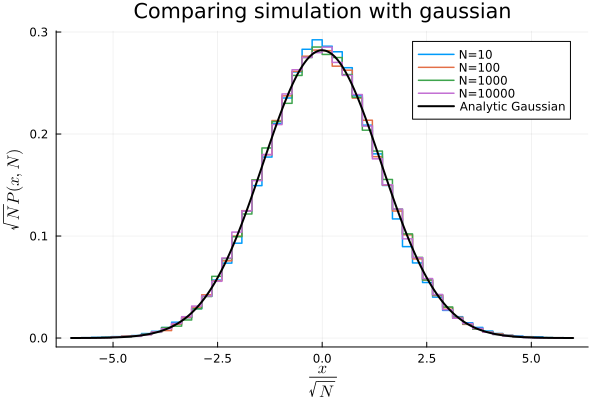

In [7]:
plt=plot(xlabel=L"\frac{x}{\sqrt(N)}",ylabel=L"\sqrt(N)P(x,N)",title="Comparing simulation with gaussian",legend=:topright)
plt = plot(
    xlabel = L"\frac{x}{\sqrt{N}}",
    ylabel = L"\sqrt{N}P(x,N)",
    title  = "Comparing simulation with gaussian",
    legend = :topright
)

nbins=50
for N in Ns
    x = walkers[N]
    z = x./ sqrt(N)
    edges = range(-6,6, length = nbins+1)
    h = fit(Histogram, z, edges)
    h = StatsBase.normalize(h, mode=:pdf)
    left_edges = h.edges[1][1:end-1]   ## CHANGED: use left edges, not centers
    plot!(plt,left_edges,h.weights,seriestype=:steppost,label="N=$N", lw=1.5)
end


xgrid = range(-6,6,length=400)
theory_var = 2*l0^2
theory_mean = 0
gaussian(x)= (1/sqrt(2*pi*theory_var))*exp(-(x-theory_mean)^2/(2*theory_var))
plot!(plt,xgrid,gaussian.(xgrid),label="Analytic Gaussian",lw=2,color=:black)



display(plt)

In [8]:
var_sim   = Dict{Int, Float64}()
kurt_sim  = Dict{Int, Float64}()
var_err   = Dict{Int, Float64}()   ## NEW
kurt_err  = Dict{Int, Float64}()   ## NEW

println(rpad("N",8), rpad("var sim",15), rpad("var analytic",18),
        rpad("kurt sim",15), "kurt analytic")

for N in Ns
    x = walkers[N]
    x_avg = mean(x)
    x2_avg = mean(x.^2)
    x_var = x2_avg - (x_avg)^2

    x4_avg = mean(x.^4)
    x_kurt = x4_avg/(x_var^2) - 3

    var_sim[N]  = x_var
    kurt_sim[N] = x_kurt

    ## NEW: bootstrap error bars
    var_func(sample)  = mean(sample.^2) - mean(sample)^2
    kurt_func(sample) = mean(sample.^4)/(var_func(sample)^2) - 3

    var_err[N]  = bootstrap_error(x, var_func)
    kurt_err[N] = bootstrap_error(x, kurt_func)

    ana_var = 2*N*l0^2
    ana_kurt = 3/N

    println(rpad(N,8), rpad(round(x_var,digits=3),15) * " ± " * rpad(round(var_err[N],digits=3),10),
            rpad(round(ana_var,digits=3),18),
            rpad(round(x_kurt,digits=4),15) * " ± " * rpad(round(kurt_err[N],digits=4),10),
            round(ana_kurt,digits=4))
end

N       var sim        var analytic      kurt sim       kurt analytic
10      20.206          ± 0.097     20.0              0.3136          ± 0.0208    0.3
100     199.723         ± 0.94      200.0             0.039           ± 0.0166    0.03
1000    1993.849        ± 9.04      2000.0            0.0015          ± 0.0149    0.003
10000   19970.944       ± 88.266    20000.0           0.0045          ± 0.0148    0.0003


In [12]:

gr()

default(fontfamily="Computer Modern", guidefontsize=13, tickfontsize=11,
        legendfontsize=11, titlefontsize=15, framestyle=:box,
        grid=true, gridalpha=0.25, gridstyle=:dot,
        size=(650,450), dpi=300, margin=5Plots.mm)

Ngrid = range(minimum(Ns), maximum(Ns), length=200)
var_th = 2 .* l0^2 .* Ngrid
kurt_th= 3 ./ Ngrid;

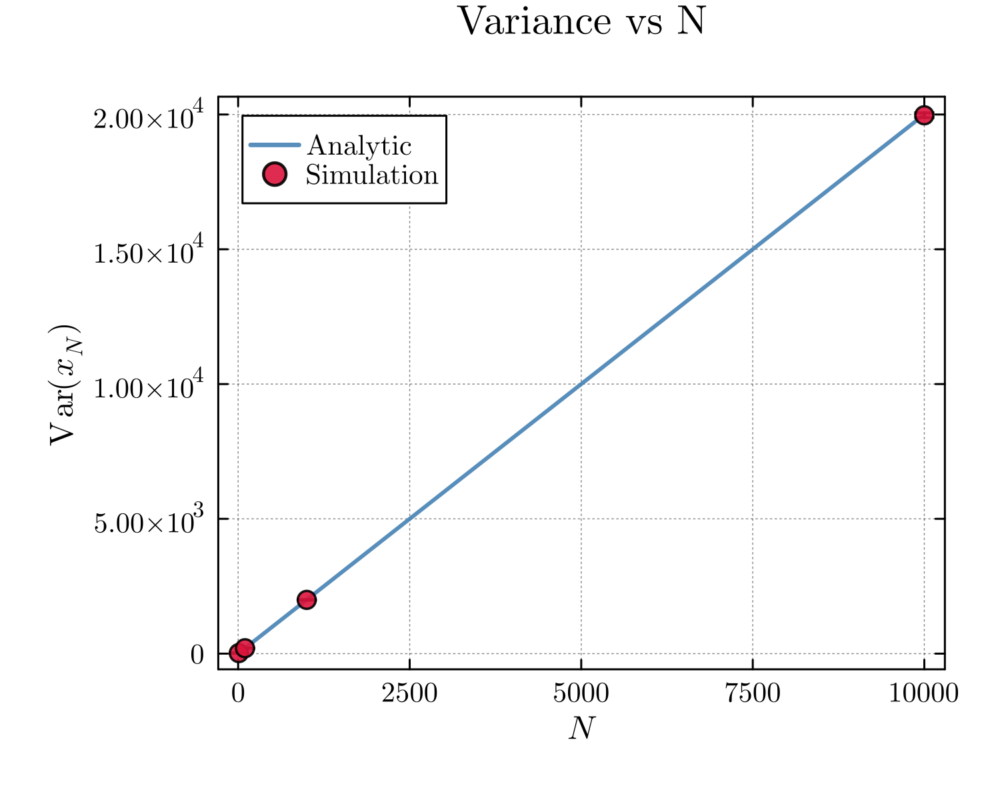

In [13]:
p1 = plot(Ngrid, var_th,
    label="Analytic",
    lw=2, color=:steelblue, alpha=0.9,
    xlabel=L"N", ylabel=L"\mathrm{Var}(x_N)",
    title="Variance vs N",
    titlefontsize=13, guidefontsize=11, tickfontsize=9, legendfontsize=9,
    legend=:topleft,
    grid=true, gridalpha=0.25,
    framestyle=:box,
    background_color=:white,
    size=(500,400))

scatter!(p1, Ns, [var_sim[N] for N in Ns],
    yerror=[var_err[N] for N in Ns],
    label="Simulation",
    ms=5, markershape=:circle,
    markerstrokewidth=1.5, markerstrokecolor=:black,
    color=:crimson, markeralpha=0.9)

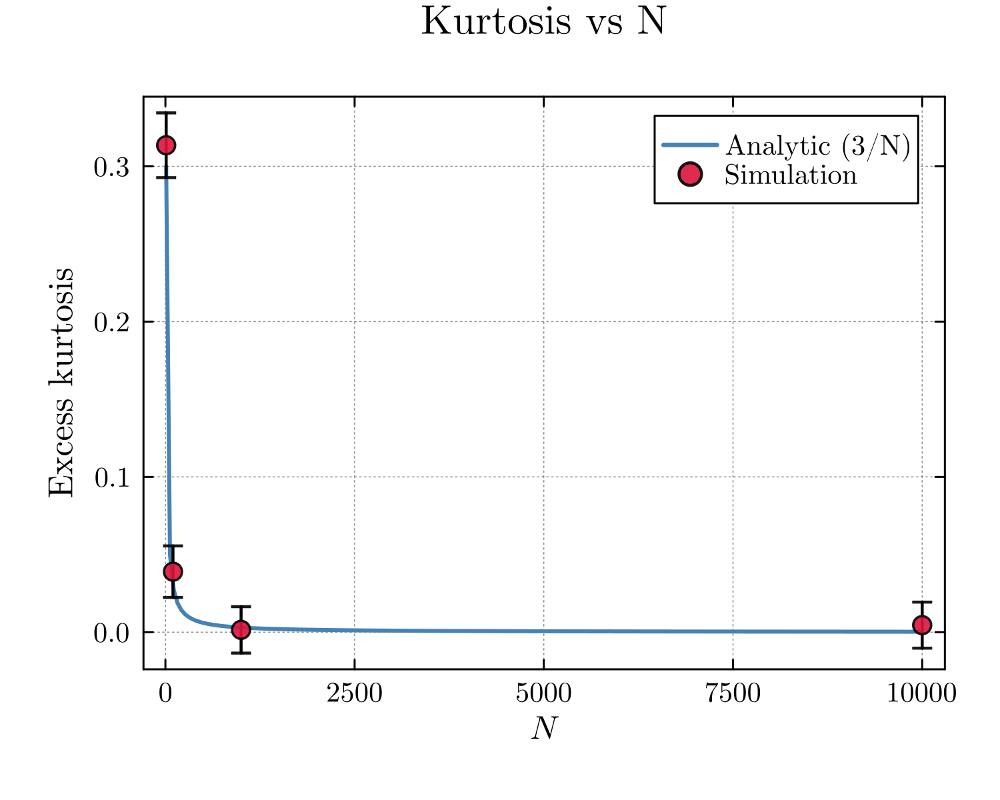

In [14]:
p2 = plot(Ngrid, kurt_th,
          label="Analytic (3/N)",
          lw=2,
          color=:steelblue,
          xlabel=L"N",
          ylabel="Excess kurtosis",
          title="Kurtosis vs N",
          titlefontsize=13,
          guidefontsize=11,
          tickfontsize=9,
          legendfontsize=9,
          legend=:topright,
          grid=true,
          gridalpha=0.25,
          framestyle=:box,
          background_color=:white,
          size=(500,400))

plot!(p2, Ns, [kurt_sim[N] for N in Ns],
      yerror=[kurt_err[N] for N in Ns],
      seriestype=:scatter,
      label="Simulation",
      ms=5,
      markershape=:circle,
      markerstrokewidth=1.5,
      markerstrokecolor=:black,
      color=:crimson,
      markeralpha=0.9)

Part c

In [50]:
alpha = 1.5 ## value of alpha
power_step_dist = Pareto(alpha, l0) ## Distributions

Pareto{Float64}(α=1.5, θ=1.0)

In [ ]:

power_walkers = Dict{Int, Vector{Float64}}()
for N in Ns
    power_walkers[N] = generate_ensemble(M, N, power_step_dist)
    println("done N=$N")
end

done N=10
done N=100
done N=1000
done N=10000


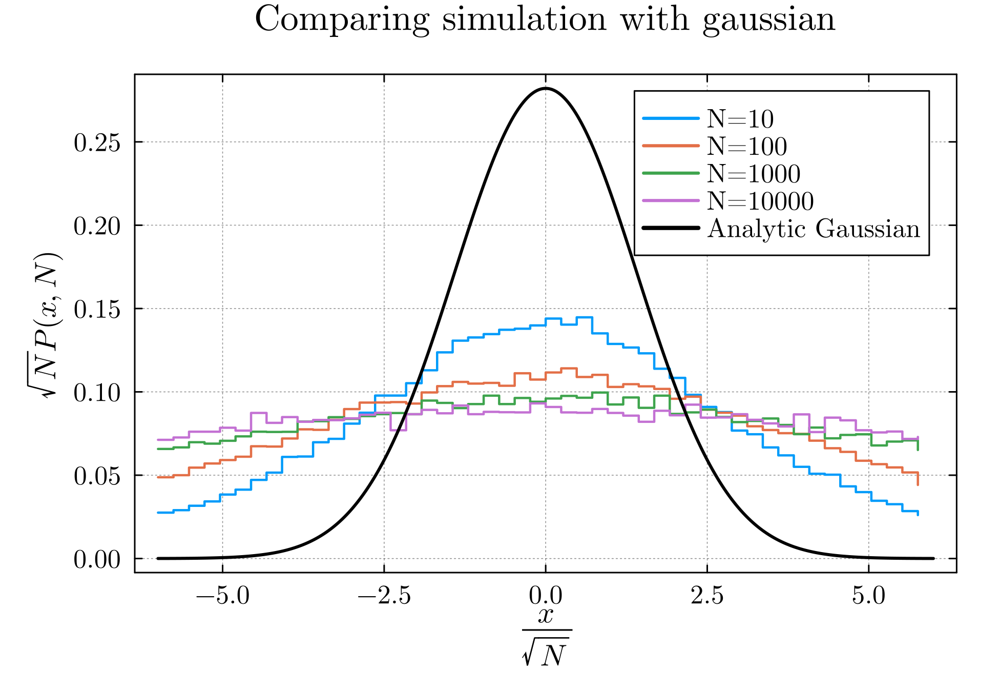

In [17]:

plt = plot(
    xlabel = L"\frac{x}{\sqrt{N}}",
    ylabel = L"\sqrt{N}P(x,N)",
    title  = "Comparing simulation with gaussian",
    legend = :topright
)

nbins=50
for N in Ns
    x = power_walkers[N]
    z = x./ sqrt(N)
    edges = range(-6,6, length = nbins+1)
    h = fit(Histogram, z, edges)
    h = StatsBase.normalize(h, mode=:pdf)
    left_edges = h.edges[1][1:end-1]   ## CHANGED: use left edges, not centers
    plot!(plt,left_edges,h.weights,seriestype=:steppost,label="N=$N", lw=1.5)
end


xgrid = range(-6,6,length=400)
theory_var = 2*l0^2
theory_mean = 0
gaussian(x)= (1/sqrt(2*pi*theory_var))*exp(-(x-theory_mean)^2/(2*theory_var))
plot!(plt,xgrid,gaussian.(xgrid),label="Analytic Gaussian",lw=2,color=:black)



display(plt)

In [18]:
power_median_sim = Dict{Int, Float64}()
power_median_err = Dict{Int, Float64}()

println(rpad("N",8), rpad("median|x_N|",15), "error")

for N in Ns
    x = power_walkers[N]
    power_median_sim[N] = median(abs.(x))
    power_median_err[N] = bootstrap_error(abs.(x),median)

    println(rpad(N,8), rpad(round(power_median_sim[N],digits=4),15), round(power_median_err[N],digits=4))
end

N       

median|x_N|    error
10      7.3526         0.0322
100     36.2516        0.1372
1000    174.1913       0.6195
10000   821.2067       3.2394


In [19]:
logNs = log10.(Ns)
log_pow_meds = log10.([power_median_sim[N] for N in Ns])

log_pow_med_errs = [power_median_err[N] / (power_median_sim[N]*log(10)) for N in Ns]

## weighted least squares: weight = 1/sigma^2
w = 1.0 ./ log_pow_med_errs.^2
n = length(logNs)

xbar = sum(w .* logNs) / sum(w)
ybar = sum(w .* log_pow_meds) / sum(w)

beta = sum(w .* (logNs .- xbar) .* (log_pow_meds .- ybar)) / sum(w .* (logNs .- xbar).^2)
c = ybar - beta*xbar

predicted = beta .* logNs .+ c
residuals = log_pow_meds .- predicted
chi2 = sum(w .* residuals.^2)
beta_err = sqrt(1 / sum(w .* (logNs .- xbar).^2))

println("\nFitted power-law exponent: beta = ", round(beta, digits=3), " ± ", round(beta_err, digits=3))
println("chi^2 = ", round(chi2, digits=3), " (", n-2, " dof)")



Fitted power-law exponent: beta = 0.682 ± 0.001
chi^2 = 32.537 (2 dof)


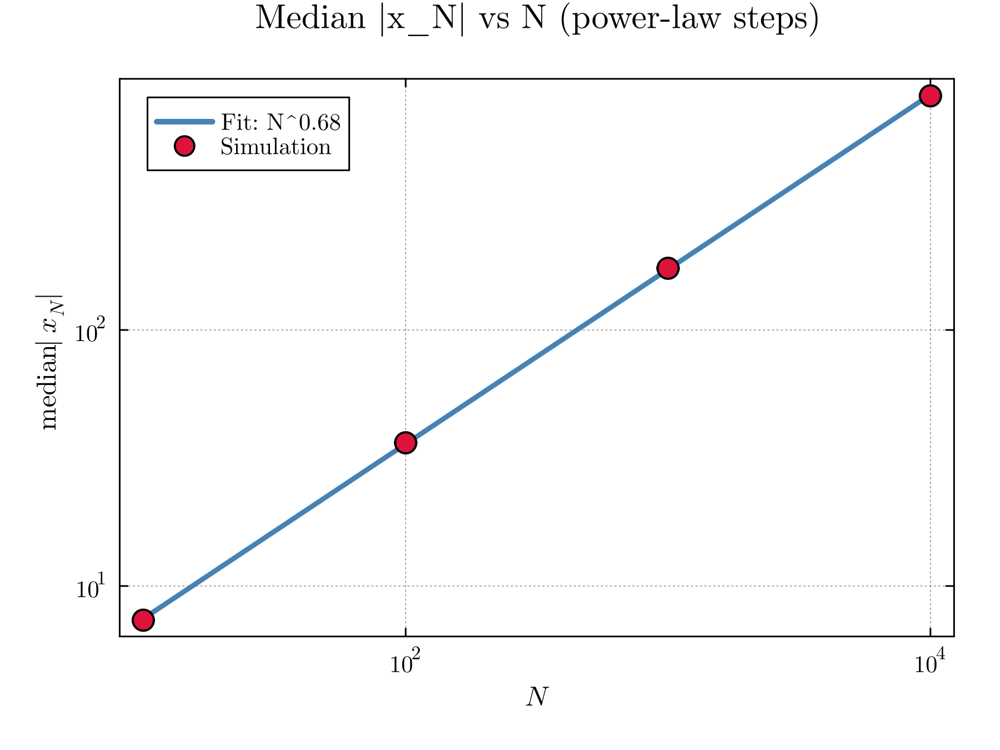

In [20]:
plt_med = plot(
    xlabel=L"N", ylabel=L"\mathrm{median}|x_N|",
    title="Median |x_N| vs N (power-law steps)",
    titlefontsize=13, guidefontsize=11, tickfontsize=9, legendfontsize=9,
    xscale=:log10, yscale=:log10,
    legend=:topleft, grid=true, gridalpha=0.25, framestyle=:box,
    background_color=:white, size=(600,450)
)

Ngrid_fit = range(minimum(Ns), maximum(Ns), length=200)
fit_curve = (10^c) .* Ngrid_fit .^ beta
plot!(plt_med, Ngrid_fit, fit_curve,
      label="Fit: N^$(round(beta,digits=2))",
      lw=3, color=:steelblue)

scatter!(plt_med, Ns, [power_median_sim[N] for N in Ns],
      yerror=[power_median_err[N] for N in Ns],
      label="Simulation", ms=7, markershape=:circle,
      markerstrokewidth=1.5, markerstrokecolor=:black, color=:crimson)

display(plt_med)

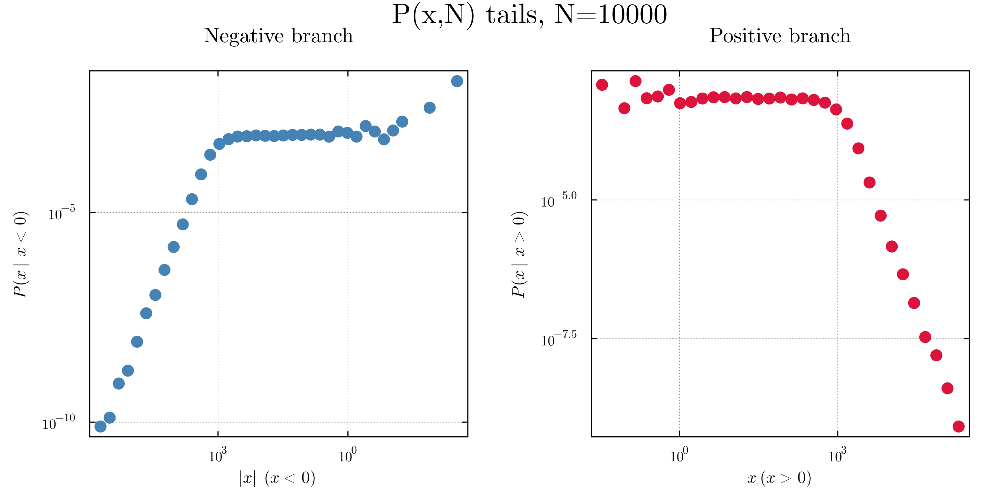

In [21]:
## --- (c)(iii): two-panel log-log plot, negative branch | positive branch ---

N_fixed = 10^4
x = power_walkers[N_fixed]

x_pos = x[x .> 0]
x_neg = -x[x .< 0]   ## flip sign to positive so we can log-bin it

## shared log-spaced bins so both panels use the same scale
all_vals = vcat(x_pos, x_neg)
nbins_tail = 40
edges_tail = exp10.(range(log10(minimum(all_vals[all_vals .> 0])), log10(maximum(all_vals)), length=nbins_tail+1))

h_pos = StatsBase.normalize(fit(Histogram, x_pos, edges_tail), mode=:pdf)
h_neg = StatsBase.normalize(fit(Histogram, x_neg, edges_tail), mode=:pdf)

edges_vec = collect(h_pos.edges[1])
centers = sqrt.(edges_vec[1:end-1] .* edges_vec[2:end])   ## geometric mean for log bins

mask_pos = h_pos.weights .> 0
mask_neg = h_neg.weights .> 0

p_left = plot(centers[mask_neg], h_neg.weights[mask_neg],
    seriestype=:scatter, xscale=:log10, yscale=:log10, xflip=true,
    xlabel=L"|x| \ (x<0)", ylabel=L"P(x \mid x<0)",   ## CHANGED
    title="Negative branch", label="Simulation", ms=6, color=:steelblue,
    markerstrokewidth=0, legend=false, titlefontsize=12, guidefontsize=10,
    tickfontsize=8, grid=true, gridalpha=0.25, framestyle=:box, background_color=:white)

p_right = plot(centers[mask_pos], h_pos.weights[mask_pos],
    seriestype=:scatter, xscale=:log10, yscale=:log10,
    xlabel=L"x \ (x>0)", ylabel=L"P(x \mid x>0)",   ## CHANGED
    title="Positive branch", label="Simulation", ms=6, color=:crimson,
    markerstrokewidth=0, legend=false, titlefontsize=12, guidefontsize=10,
    tickfontsize=8, grid=true, gridalpha=0.25, framestyle=:box, background_color=:white)

plot(p_left, p_right, layout=(1,2), size=(900,450),
     plot_title="P(x,N) tails, N=$N_fixed")

display(current())

Positive branch tail slope: -2.522 ± 0.046  (n=9 points)
Negative branch tail slope: -2.636 ± 0.049  (n=11 points)
Expected slope = -(1+alpha) = -2.5


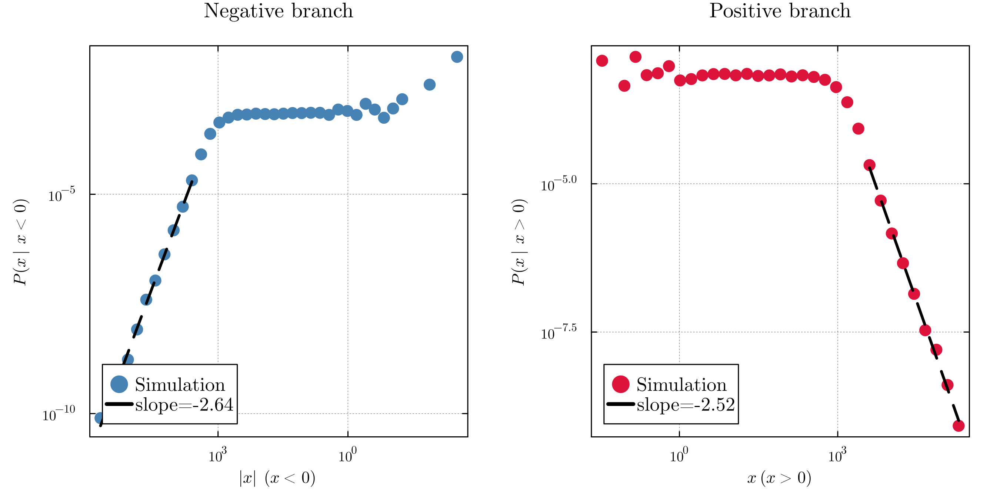

In [22]:
## --- (c)(iii): fit tail slope on both branches (Option 1 normalization) ---

## threshold: only fit points well into the tail, past the bulk
threshold = 3 * median(abs.(power_walkers[N_fixed]))

## --- Positive branch ---
tail_mask_pos = centers[mask_pos] .> threshold
logx_pos = log10.(centers[mask_pos][tail_mask_pos])
logy_pos = log10.(h_pos.weights[mask_pos][tail_mask_pos])

n_pos = length(logx_pos)
xbar_p = mean(logx_pos); ybar_p = mean(logy_pos)
slope_pos = sum((logx_pos .- xbar_p).*(logy_pos .- ybar_p)) / sum((logx_pos .- xbar_p).^2)
intercept_pos = ybar_p - slope_pos*xbar_p
resid_p = logy_pos .- (slope_pos.*logx_pos .+ intercept_pos)
err_pos = sqrt( (sum(resid_p.^2)/max(n_pos-2,1)) / sum((logx_pos .- xbar_p).^2) )

## --- Negative branch ---
tail_mask_neg = centers[mask_neg] .> threshold
logx_neg = log10.(centers[mask_neg][tail_mask_neg])
logy_neg = log10.(h_neg.weights[mask_neg][tail_mask_neg])

n_neg = length(logx_neg)
xbar_n = mean(logx_neg); ybar_n = mean(logy_neg)
slope_neg = sum((logx_neg .- xbar_n).*(logy_neg .- ybar_n)) / sum((logx_neg .- xbar_n).^2)
intercept_neg = ybar_n - slope_neg*xbar_n
resid_n = logy_neg .- (slope_neg.*logx_neg .+ intercept_neg)
err_neg = sqrt( (sum(resid_n.^2)/max(n_neg-2,1)) / sum((logx_neg .- xbar_n).^2) )

println("Positive branch tail slope: ", round(slope_pos,digits=3), " ± ", round(err_pos,digits=3), "  (n=$n_pos points)")
println("Negative branch tail slope: ", round(slope_neg,digits=3), " ± ", round(err_neg,digits=3), "  (n=$n_neg points)")
println("Expected slope = -(1+alpha) = ", -(1+alpha))

## --- overlay fit lines on the two-panel plot ---
xgrid_pos = range(minimum(centers[mask_pos][tail_mask_pos]), maximum(centers[mask_pos]), length=100)
fit_pos = (10^intercept_pos) .* xgrid_pos .^ slope_pos
plot!(p_right, xgrid_pos, fit_pos, lw=2.5, linestyle=:dash, color=:black,
      label="slope=$(round(slope_pos,digits=2))", legend=:bottomleft)

xgrid_neg = range(minimum(centers[mask_neg][tail_mask_neg]), maximum(centers[mask_neg]), length=100)
fit_neg = (10^intercept_neg) .* xgrid_neg .^ slope_neg
plot!(p_left, xgrid_neg, fit_neg, lw=2.5, linestyle=:dash, color=:black,
      label="slope=$(round(slope_neg,digits=2))", legend=:bottomleft)

plot(p_left, p_right, layout=(1,2), size=(900,450))

Exponential: [2052.673807225715, 1944.5606516156242, 1993.8770756308222]
Power-law:   [537709.1741587776, 1.0314411987394474e6, 2.3387997890432947e6]


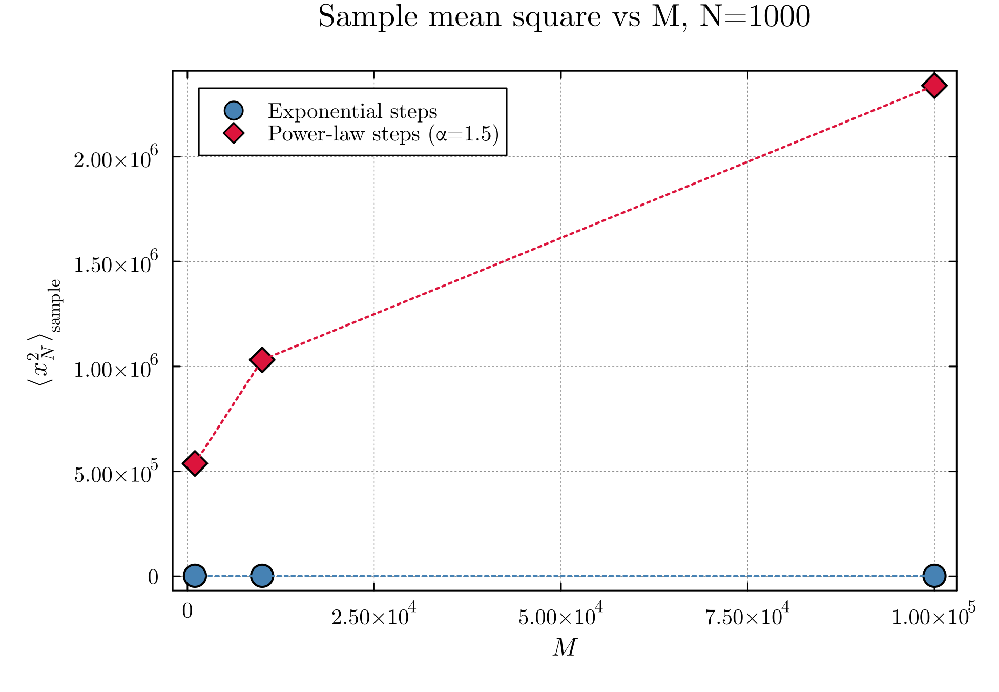

In [45]:
## --- (c)(iv) plot: mean square vs M, exponential vs power-law ---

N_fixed = 1000
Ms_test = [10^3, 10^4, 10^5]

x_exp   = walkers[N_fixed]
x_power = power_walkers[N_fixed]

ms_exp_vals   = [mean(x_exp[1:M_sub].^2) for M_sub in Ms_test]
ms_power_vals = [mean(x_power[1:M_sub].^2) for M_sub in Ms_test]

println("Exponential: ", ms_exp_vals)
println("Power-law:   ", ms_power_vals)

plt_settle = plot(
    Ms_test, ms_exp_vals,
    seriestype=:scatter,
    xlabel=L"M", ylabel=L"\langle x_N^2\rangle_{\mathrm{sample}}",
    title="Sample mean square vs M, N=$N_fixed",
    label="Exponential steps", ms=8, markershape=:circle,
    color=:steelblue, markerstrokecolor=:black, markerstrokewidth=1.5,
    titlefontsize=13, guidefontsize=11, tickfontsize=9, legendfontsize=9,
    legend=:topleft, grid=true, gridalpha=0.25, framestyle=:box,
    background_color=:white, size=(650,450))

plot!(plt_settle, Ms_test, ms_exp_vals, lw=1.5, ls=:dot, color=:steelblue, label="")

scatter!(plt_settle, Ms_test, ms_power_vals,
    label="Power-law steps (α=1.5)", ms=8, markershape=:diamond,
    color=:crimson, markerstrokecolor=:black, markerstrokewidth=1.5)
plot!(plt_settle, Ms_test, ms_power_vals, lw=1.5, ls=:dot, color=:crimson, label="")

## reference line: analytic exponential prediction (should match the settled value)
#hline!(plt_settle, [2*N_fixed*l0^2], label="Analytic (exponential)", lw=2, ls=:dash, color=:black)

display(plt_settle)

In [47]:
## --- New function: single run that ALSO tracks the largest |step| ---
function single_run_with_max(N, step_dist)
    x = 0.0
    max_step = 0.0
    for i in 1:N
        dir = rand(Bool) ? 1.0 : -1.0
        l = rand(step_dist)
        step = dir * l
        x += step
        max_step = max(max_step, abs(step))
    end
    return x, max_step
end

## --- Ensemble version: generate M walkers, return BOTH arrays ---
function generate_ensemble_with_max(M, N, step_dist)
    x_all = Vector{Float64}(undef, M)
    maxstep_all = Vector{Float64}(undef, M)
    for j in 1:M
        x_all[j], maxstep_all[j] = single_run_with_max(N, step_dist)
    end
    return x_all, maxstep_all
end

generate_ensemble_with_max (generic function with 1 method)

In [51]:
## --- Generate walks at N=1000, tracking max step, for both distributions ---
N_test = 1000

x_exp_v,   max_exp_v   = generate_ensemble_with_max(M, N_test, step_dist)      ## check: use your EXPONENTIAL step_dist here
x_power_v, max_power_v = generate_ensemble_with_max(M, N_test, power_step_dist)   ## check: use your POWER-LAW step_dist (Pareto) here

## --- Ratio: max|l_i| / |x_N|, for each walker ---
ratio_exp   = max_exp_v ./ abs.(x_exp_v)
ratio_power = max_power_v ./ abs.(x_power_v)

median_ratio_exp   = median(ratio_exp)
median_ratio_power = median(ratio_power)

println("Median ratio (exponential, N=$N_test): ", round(median_ratio_exp, digits=4))
println("Median ratio (power-law, N=$N_test):    ", round(median_ratio_power, digits=4))

Median ratio (exponential, N=1000): 0.2456
Median ratio (power-law, N=1000):    0.8448


In [56]:
println("Max ratio (power-law): ", maximum(ratio_power))
println("Max ratio (exponential): ", maximum(ratio_exp))
println("Number of walkers with x_N very close to 0 (power-law): ", count(x -> abs(x) < 0.01, x_power_v))

Max ratio (power-law): 34159.008722018276
Max ratio (exponential): 14464.56189094129
Number of walkers with x_N very close to 0 (power-law): 3


In [54]:
ratio_exp

100000-element Vector{Float64}:
 0.11547912665428735
 0.432112333270965
 0.449692212483527
 0.11465379258434569
 0.37814014766097076
 0.4220310522177245
 0.18767183320532294
 0.16281806581561165
 0.6467335342663495
 0.21251831055912912
 6.64641531656368
 0.18044008049249302
 0.15481369668063946
 ⋮
 0.10357164405506103
 7.877997185440664
 0.4351467668349267
 0.13521701795708999
 0.20846635655580104
 2.896524869677262
 0.19793634521340714
 1.1558751387300539
 0.11702878394473851
 0.8574006244493989
 2.539240806981163
 2.8294412029389138

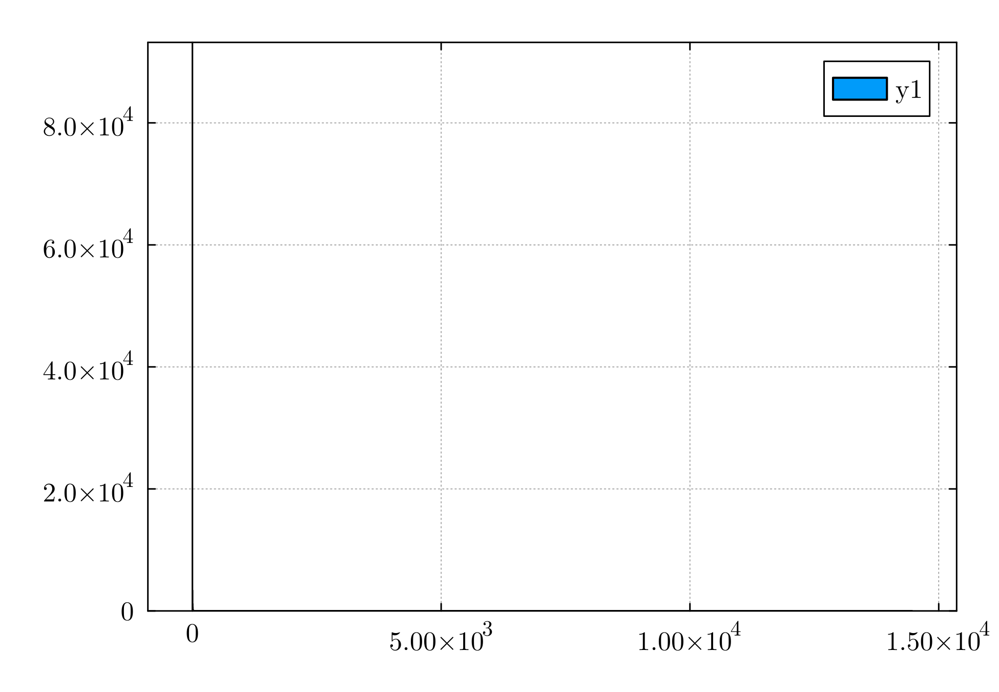

In [55]:
histogram(ratio_exp)

In [52]:
median_ratio_exp    = median(ratio_exp)
median_ratio_power  = median(ratio_power)

err_ratio_exp   = bootstrap_error(ratio_exp, median)
err_ratio_power = bootstrap_error(ratio_power, median)

println("Median ratio (exponential): ", round(median_ratio_exp,digits=4), " ± ", round(err_ratio_exp,digits=4))
println("Median ratio (power-law):   ", round(median_ratio_power,digits=4), " ± ", round(err_ratio_power,digits=4))

Median ratio (exponential): 0.2456 ± 0.001
Median ratio (power-law):   0.8448 ± 0.0028


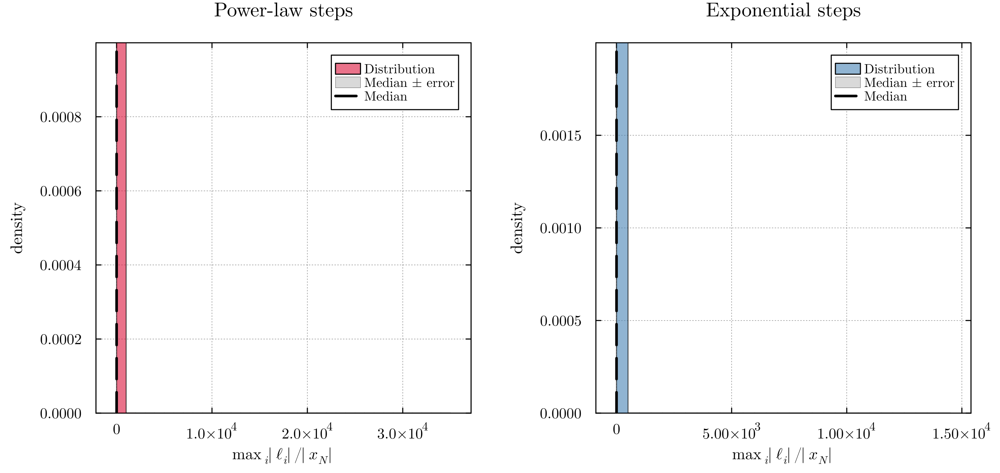

In [53]:
p_left = histogram(ratio_power, bins=50, normalize=:pdf,
    xlabel=L"\max_i|\ell_i| / |x_N|", ylabel="density",
    title="Power-law steps",
    label="Distribution", color=:crimson, alpha=0.6,
    titlefontsize=12, guidefontsize=10, tickfontsize=9, legendfontsize=8,
    legend=:topright, grid=true, gridalpha=0.25, framestyle=:box,
    background_color=:white)

vspan!(p_left, [median_ratio_power - err_ratio_power, median_ratio_power + err_ratio_power],
       color=:black, alpha=0.15, label="Median ± error")
vline!(p_left, [median_ratio_power], color=:black, lw=2.5, ls=:dash, label="Median")

p_right = histogram(ratio_exp, bins=50, normalize=:pdf,
    xlabel=L"\max_i|\ell_i| / |x_N|", ylabel="density",
    title="Exponential steps",
    label="Distribution", color=:steelblue, alpha=0.6,
    titlefontsize=12, guidefontsize=10, tickfontsize=9, legendfontsize=8,
    legend=:topright, grid=true, gridalpha=0.25, framestyle=:box,
    background_color=:white)

vspan!(p_right, [median_ratio_exp - err_ratio_exp, median_ratio_exp + err_ratio_exp],
       color=:black, alpha=0.15, label="Median ± error")
vline!(p_right, [median_ratio_exp], color=:black, lw=2.5, ls=:dash, label="Median")

plot(p_left, p_right, layout=(1,2), size=(950,450))

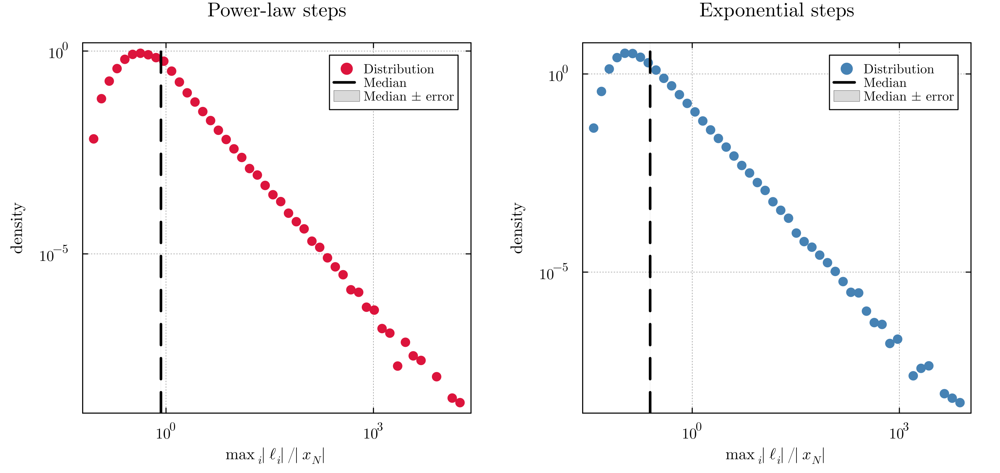

In [60]:
## --- Log-log histogram of the ratio, no clipping, both step types ---

## log-spaced bins needed since values span many decades
nbins_ratio = 50

function loglog_hist_data(ratio_vals, nbins)
    ratio_pos = ratio_vals[ratio_vals .> 0]   ## log needs strictly positive values
    edges = exp10.(range(log10(minimum(ratio_pos)), log10(maximum(ratio_pos)), length=nbins+1))
    h = fit(Histogram, ratio_pos, edges)
    h = StatsBase.normalize(h, mode=:pdf)
    edges_vec = collect(h.edges[1])
    centers = sqrt.(edges_vec[1:end-1] .* edges_vec[2:end])   ## geometric mean, correct for log bins
    mask = h.weights .> 0
    return centers[mask], h.weights[mask]
end

centers_power, weights_power = loglog_hist_data(ratio_power, nbins_ratio)
centers_exp,   weights_exp   = loglog_hist_data(ratio_exp, nbins_ratio)

median_ratio_power = median(ratio_power)
median_ratio_exp   = median(ratio_exp)
err_ratio_power    = bootstrap_error(ratio_power, median)
err_ratio_exp      = bootstrap_error(ratio_exp, median)

p_left = plot(centers_power, weights_power,
    seriestype=:scatter, xscale=:log10, yscale=:log10,
    xlabel=L"\max_i|\ell_i| / |x_N|", ylabel="density",
    title="Power-law steps",
    label="Distribution", ms=5, color=:crimson, markerstrokewidth=0,
    titlefontsize=12, guidefontsize=10, tickfontsize=9, legendfontsize=8,
    legend=:topright, grid=true, gridalpha=0.25, framestyle=:box,
    background_color=:white)

vline!(p_left, [median_ratio_power], color=:black, lw=2.5, ls=:dash, label="Median")
vspan!(p_left, [max(median_ratio_power - err_ratio_power, 1e-6), median_ratio_power + err_ratio_power],
       color=:black, alpha=0.15, label="Median ± error")

p_right = plot(centers_exp, weights_exp,
    seriestype=:scatter, xscale=:log10, yscale=:log10,
    xlabel=L"\max_i|\ell_i| / |x_N|", ylabel="density",
    title="Exponential steps",
    label="Distribution", ms=5, color=:steelblue, markerstrokewidth=0,
    titlefontsize=12, guidefontsize=10, tickfontsize=9, legendfontsize=8,
    legend=:topright, grid=true, gridalpha=0.25, framestyle=:box,
    background_color=:white)

vline!(p_right, [median_ratio_exp], color=:black, lw=2.5, ls=:dash, label="Median")
vspan!(p_right, [max(median_ratio_exp - err_ratio_exp, 1e-6), median_ratio_exp + err_ratio_exp],
       color=:black, alpha=0.15, label="Median ± error")

plot(p_left, p_right, layout=(1,2), size=(950,450))

In [ ]:
## Option: exclude walkers whose |x_N| is too close to zero (unstable denominator)
threshold_x = 1e-3 * median(abs.(x_power_v))   ## e.g. exclude if |x_N| < 0.1% of typical |x_N|

good_power = abs.(x_power_v) .> threshold_x
good_exp   = abs.(x_exp_v)   .> threshold_x

ratio_power_clean = max_power_v[good_power] ./ abs.(x_power_v[good_power])
ratio_exp_clean   = max_exp_v[good_exp]   ./ abs.(x_exp_v[good_exp])

println("Excluded from power-law: ", count(.!good_power), " walkers")
println("Excluded from exponential: ", count(.!good_exp), " walkers")

median_ratio_power_clean = median(ratio_power_clean)
median_ratio_exp_clean   = median(ratio_exp_clean)

Excluded from power-law: 59 walkers
Excluded from exponential: 301 walkers


0.24477495683976339

Median ratio (power-law, cleaned): 0.8442 ± 0.0025
Median ratio (exponential, cleaned): 0.2448 ± 0.0009


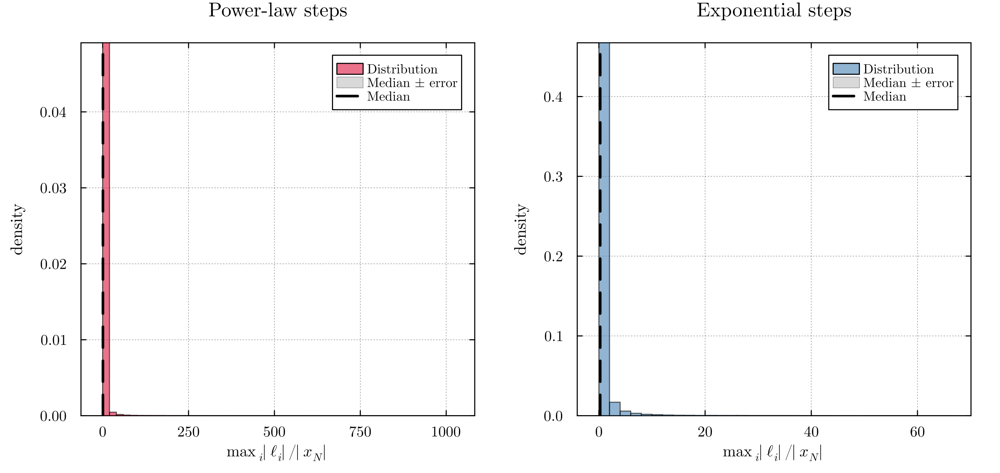

In [59]:
## --- Plot: cleaned ratio distributions, median + bootstrap error, both step types ---

err_ratio_power_clean = bootstrap_error(ratio_power_clean, median)
err_ratio_exp_clean   = bootstrap_error(ratio_exp_clean, median)

println("Median ratio (power-law, cleaned): ", round(median_ratio_power_clean,digits=4),
        " ± ", round(err_ratio_power_clean,digits=4))
println("Median ratio (exponential, cleaned): ", round(median_ratio_exp_clean,digits=4),
        " ± ", round(err_ratio_exp_clean,digits=4))

p_left = histogram(ratio_power_clean, bins=50, normalize=:pdf,
    xlabel=L"\max_i|\ell_i| / |x_N|", ylabel="density",
    title="Power-law steps",
    label="Distribution", color=:crimson, alpha=0.6,
    titlefontsize=12, guidefontsize=10, tickfontsize=9, legendfontsize=8,
    legend=:topright, grid=true, gridalpha=0.25, framestyle=:box,
    background_color=:white)

vspan!(p_left, [median_ratio_power_clean - err_ratio_power_clean,
                median_ratio_power_clean + err_ratio_power_clean],
       color=:black, alpha=0.15, label="Median ± error")
vline!(p_left, [median_ratio_power_clean], color=:black, lw=2.5, ls=:dash, label="Median")

p_right = histogram(ratio_exp_clean, bins=50, normalize=:pdf,
    xlabel=L"\max_i|\ell_i| / |x_N|", ylabel="density",
    title="Exponential steps",
    label="Distribution", color=:steelblue, alpha=0.6,
    titlefontsize=12, guidefontsize=10, tickfontsize=9, legendfontsize=8,
    legend=:topright, grid=true, gridalpha=0.25, framestyle=:box,
    background_color=:white)

vspan!(p_right, [median_ratio_exp_clean - err_ratio_exp_clean,
                 median_ratio_exp_clean + err_ratio_exp_clean],
       color=:black, alpha=0.15, label="Median ± error")
vline!(p_right, [median_ratio_exp_clean], color=:black, lw=2.5, ls=:dash, label="Median")

plot(p_left, p_right, layout=(1,2), size=(950,450))

Random things

In [1]:
using Random
using Statistics
using StatsBase         
using Plots
using Distributions
using StatsPlots
using KernelDensity

In [2]:
### Setting some values of constant
l0 = 1 ## mean length per run
M = 10^4 ## No. of runs in a single simulation

10000

In [3]:
function single_simulation(l0,M) ### The final position after M no of steps
    l_arr = rand(Exponential(l0),M) ## l array 
    dir_arr = rand([1,-1],M) ## Direction array
    step_arr = l_arr.*dir_arr ## Steps
    x = sum(step_arr) ## Final position after M number of runs or steps (I can do this, because each steps are independent)
    return x
end

function simulation_data(l0,M,N) ### Data of final x for N no. of ensembles
    x_arr = zeros(N)
    for i in 1:N
        x_arr[i] = single_simulation(l0,M)
    end
    return x_arr
end

simulation_data (generic function with 1 method)

In [4]:
Ensembles_arr = [ 10, 10^2 , 10^3, 10^ 4] ## No. of Ensembles to get histogram

results = [simulation_data(l0, M, N) for N in Ensembles_arr]

4-element Vector{Vector{Float64}}:
 [2.91434012551408, 144.483113664789, -73.12882569499075, -41.52762733367548, 122.99154266821057, -117.805568904909, 78.07261917883767, -156.21818998317497, -165.77854791682373, 159.36302072860514]
 [114.38426979617753, -139.45241627373014, -23.2225014331893, -22.646424258418435, 138.20605154634848, 163.83792155284516, -22.895341851788423, -26.890915999226877, -93.32479126845035, -161.55028918357215  …  84.58770718082035, 248.48942291372543, 44.74158538880853, -215.29314312472636, -81.88785594484031, -55.86661239388066, -32.62559076766433, 117.62173262736246, 52.05659151494497, 439.8627514642329]
 [134.52785791277054, -9.396331237085974, -71.8016115690709, 178.83946217983768, 145.50224380458206, 171.53734649607796, 26.55432064527581, 19.741469702010598, 173.36085390021105, -95.04681081243871  …  -187.95593880494837, -102.58821705072319, 223.5368613458686, 0.7503032869217634, -186.47372181662237, -35.762686918089116, 15.35243840830799, 46.5952268426271

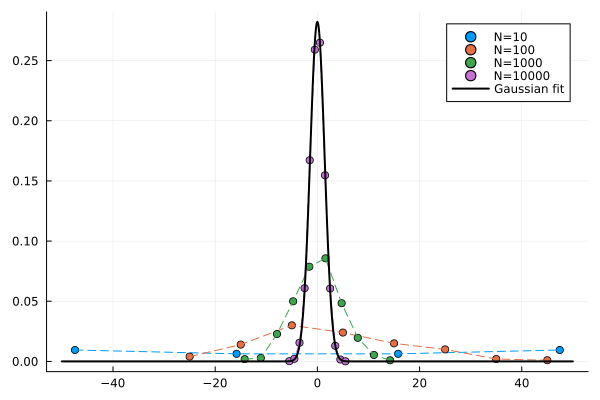

In [19]:
hist_data = Dict()
plt = plot()

for (i, N) in enumerate(Ensembles_arr)
    x_arr = results[i]
    
    h = fit(Histogram, x_arr)
    h = StatsBase.normalize(h, mode=:pdf)
    
    edges = h.edges[1]
    centers = (edges[1:end-1] .+ edges[2:end]) ./ 2
    counts = h.weights

    x_scaled = centers ./ sqrt(N)
    y_scaled = sqrt(N) .* counts   
    
    hist_data[N] = (x_scaled, y_scaled)   # store both x and y values

    c = palette(:default)[i]   # pick color i from the default palette

    scatter!(plt, x_scaled, y_scaled, color=c, label="N=$N")
    plot!(plt, x_scaled, y_scaled, linestyle=:dash, color=c, label="")
end

gauss = Normal(0, sqrt(2)*l0)

x_gauss = range(-50, 50, length=5000)   # reasonable x-range to cover the curve
y_gauss = pdf.(gauss, x_gauss)

plot!(plt, x_gauss, y_gauss, color=:black, linewidth=2, label="Gaussian fit")
plt

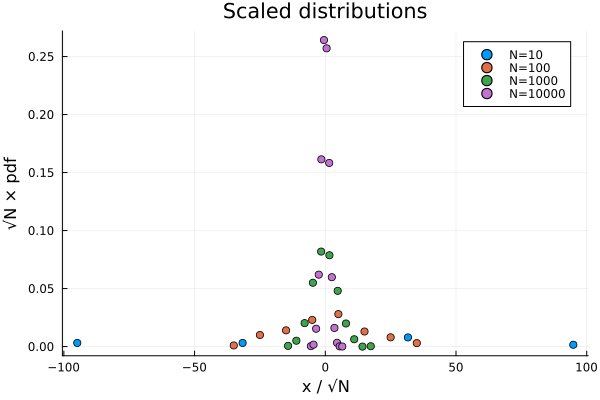

In [ ]:
plt = plot()

for (i, N) in enumerate(Ensembles_arr)
    x_arr = results[i]
    
    h = fit(Histogram, x_arr)
    h = StatsBase.normalize(h, mode=:pdf)
    
    edges = h.edges[1]
    centers = (edges[1:end-1] .+ edges[2:end]) ./ 2
    counts = h.weights
    
    x_scaled = centers ./ sqrt(N)
    y_scaled = sqrt(N) .* counts
    
    scatter!(plt, x_scaled, y_scaled, label = "N=$N", lw = 2)
    plot!()
end

xlabel!("x / √N")
ylabel!("√N × pdf")
title!("Scaled distributions")

plt

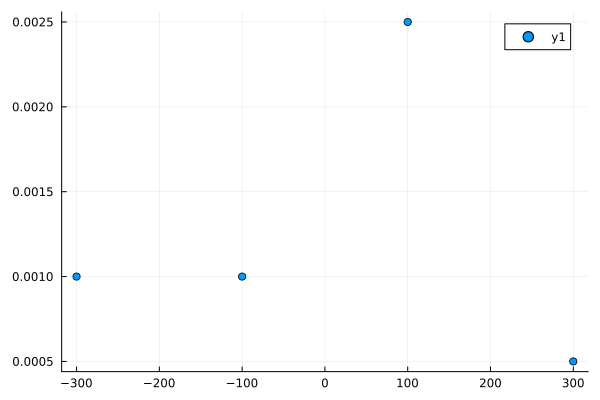

In [57]:
scatter(hist_data[10][1],hist_data[10][2])
#scatter!(hist_data[100][1],hist_data[100][2])
#scatter!(hist_data[10^3][1],hist_data[10^3][2])
#scatter!(hist_data[10^4][1],hist_data[10^4][2])

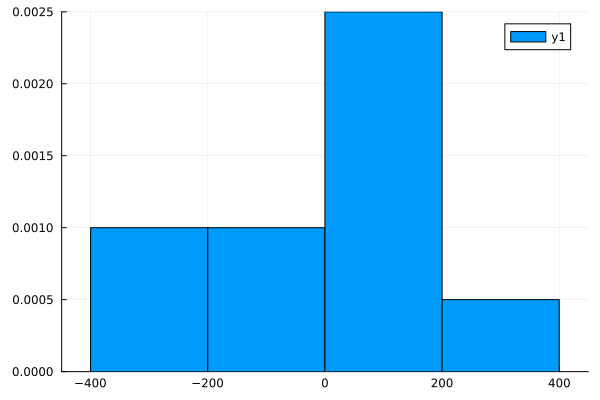

In [48]:
histogram(results[1],normalize=:pdf)

In [17]:
hist_data = Dict()

for (i, N) in enumerate(Ensembles_arr)
    x_arr = results[i]
    
    lo, hi = extrema(x_arr)
    nbins = round(Int, hi - lo) + 1
    edges = range(lo, hi, length = nbins + 1)
    
    h = fit(Histogram, x_arr, edges)
    h = StatsBase.normalize(h, mode=:pdf)
    
    edges = h.edges[1]
    centers = (edges[1:end-1] .+ edges[2:end]) ./ 2
    counts = h.weights
    
    # keep only bins with nonzero counts
    mask = counts .!= 0
    centers = centers[mask]
    counts = counts[mask]
    
    hist_data[N] = (centers, counts)
end

In [18]:
hist_data[10]

([-304.26599189074847, -301.273636794263, -213.49788729735576, -169.61001254890215, -65.87503587073901, -62.882680774253544, 19.905810228511243, 41.849747602738056, 52.821716289851466], [0.11139497906676712, 0.11139497906676712, 0.11139497906676712, 0.11139497906676712, 0.11139497906676712, 0.11139497906676712, 0.11139497906676712, 0.11139497906676712, 0.11139497906676712])

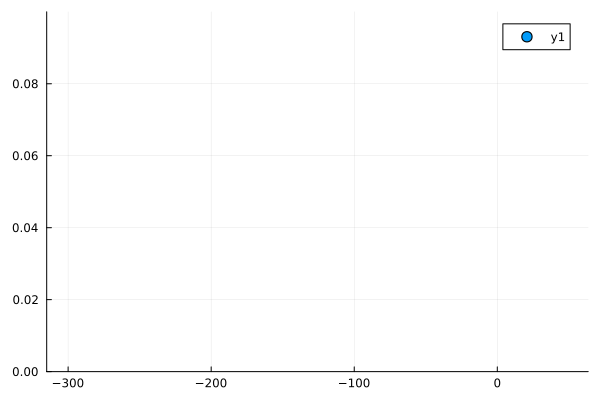

In [22]:
scatter(hist_data[10][1],hist_data[10][2])
ylims!(0,0.1)

In [10]:
x_arr = results[1]

lo, hi = extrema(x_arr)
nbins = round(Int, hi - lo) + 1
edges = range(lo, hi, length = nbins + 1)

-304.7647177401627:0.9974516988284915:242.83626491667908

In [12]:
nbins

549

In [6]:
hist_data = Dict()

for (i, N) in enumerate(Ensembles_arr)
    x_arr = results[i]
    
    h = fit(Histogram, x_arr)
    h = StatsBase.normalize(h, mode=:pdf)
    
    edges = h.edges[1]
    centers = (edges[1:end-1] .+ edges[2:end]) ./ 2
    counts = h.weights
    
    hist_data[N] = (centers, counts)   # store both x and y values
end

In [8]:
hist_data[10][1]

-350.0:100.0:250.0

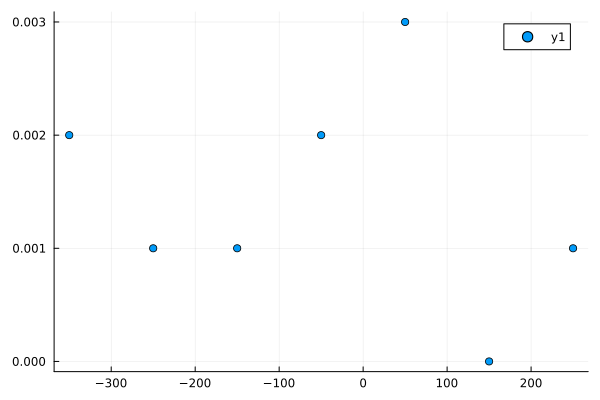

In [9]:
scatter(hist_data[10][1],hist_data[10][2])

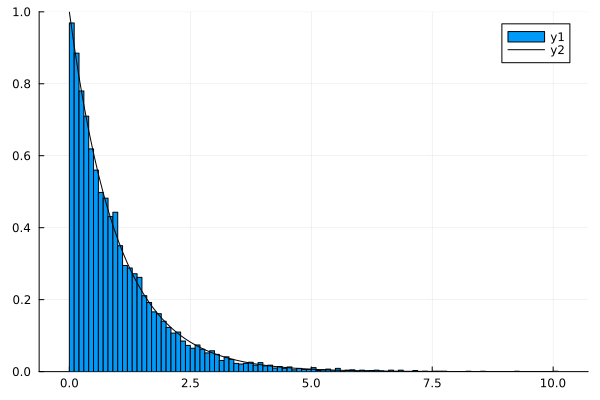

In [22]:
histogram(l_arr,normalize=:pdf)
plot!(0:0.1:10,pdf.(Exponential(l0),0:0.1:10),color="black")